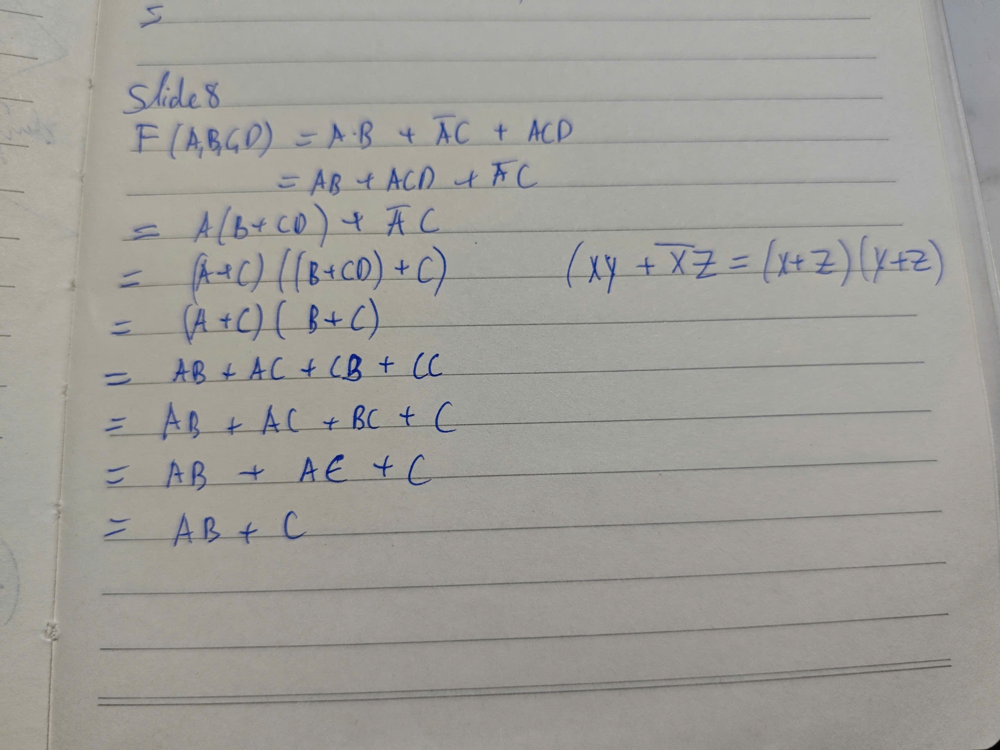

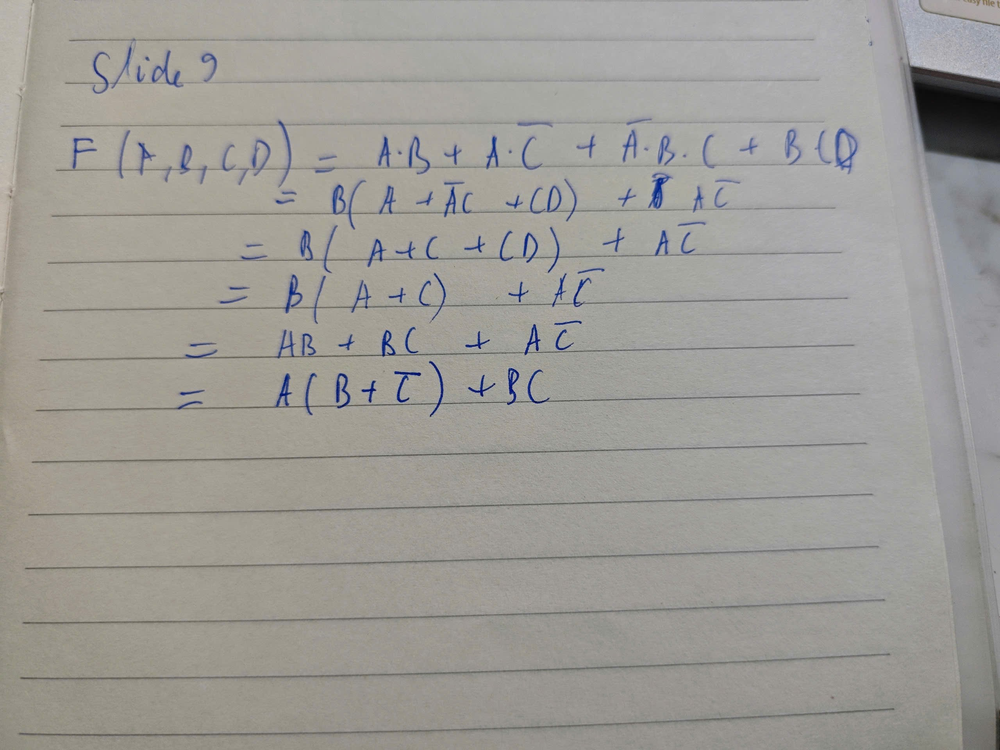

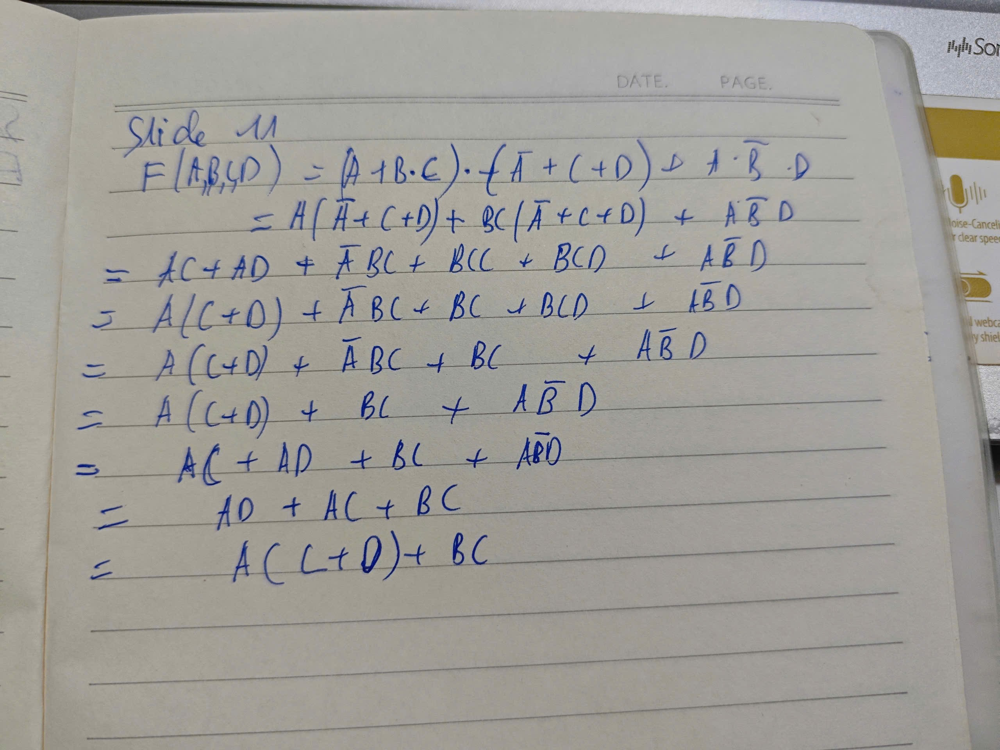

slide 28

Câu 1: Kiểm tra một số nguyên dương N xem có phải là bội số của 4 hay không?

In [5]:
def ktBoiSo(N):
    return N % 4 == 0

# Test
print(ktBoiSo(12))  # True
print(ktBoiSo(7))  # False


True
False


Câu 2: Kiểm tra một số trong hệ nhị phân có đúng 3 bit bất
kỳ bằng 1.

In [8]:
def ktBit(N):
    count = 0
    while N > 0:
        N &= (N - 1)  # xóa đi 1 bit 1 mỗi lần
        count += 1
    return count == 3

print(ktBit(7))  # True
print(ktBit(8))  # False

True
False


Câu 3: Kiểm tra số bit 1 chẵn hay lẻ trong một chuỗi nhị phân
có độ dài N bit.

In [ ]:
def ktBitChanLe(N):
    parity = 0
    while N > 0:
        parity ^= 1  # đổi trạng thái giữa 0 và 1
        N &= (N - 1)
    return parity == 0

print(ktBitChanLe(7))  # False
print(ktBitChanLe(3))  # True


False
True


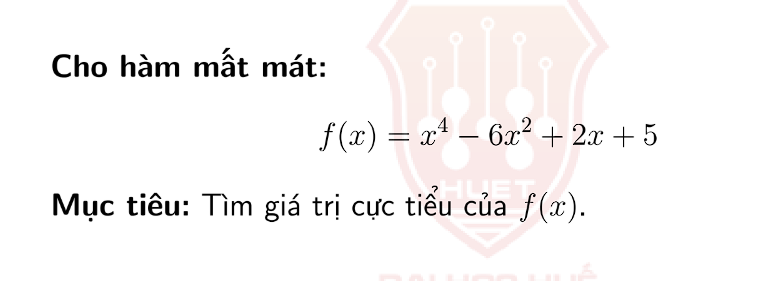

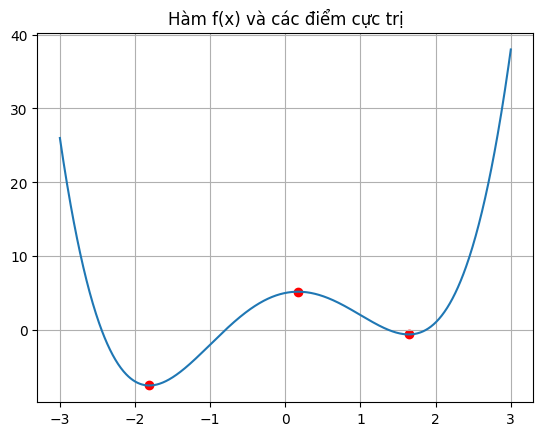

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve

f = lambda x: x**4 - 6*x**2 + 2*x + 5
f_prime = lambda x: 4*x**3 - 12*x + 2

x = np.linspace(-3, 3, 1000)
crit_points = fsolve(f_prime, [-2, 0, 2])

plt.plot(x, f(x))
plt.scatter(crit_points, f(crit_points), color='red')
plt.title("Hàm f(x) và các điểm cực trị")
plt.grid()
plt.show()


Gradient Descent (GD)

In [46]:
# Hàm Gradient Descent
def gradient_descent(lr=0.01, epochs=1000, start=0):
    x = start
    for _ in range(epochs):
        grad = df(x)
        x -= lr * grad
    return x, f(x)

# Khởi tạo nhiều điểm bắt đầu
starts = [-2, 2]  # Gần các cực trị ta thấy qua đồ thị
results = {}

for start in starts:
    x_min, f_min = gradient_descent(start=start)
    results[f"GD (start={start})"] = (x_min, f_min)

# In kết quả
for method, (x_min, f_min) in results.items():
    print(f"{method}: x_min = {x_min:.4f}, f_min = {f_min:.4f}")


GD (start=-2): x_min = -1.8100, f_min = -7.5438
GD (start=2): x_min = 1.6418, f_min = -0.6237


Stochastic Gradient Descent (SGD)

In [48]:
# Stochastic Gradient Descent (SGD)
def stochastic_gradient_descent(lr=0.01, epochs=1000, start=0):
    x = start
    for _ in range(epochs):
        grad = df(x) + np.random.normal(0, 0.1)  # Thêm nhiễu (noise)
        x -= lr * grad
    return x, f(x)

# Chạy SGD từ 2 điểm bắt đầu
starts = [-2, 2]
results = {}

for start in starts:
    x_min, f_min = stochastic_gradient_descent(start=start)
    results[f"SGD (start={start})"] = (x_min, f_min)

# In kết quả
for method, (x_min, f_min) in results.items():
    print(f"{method}: x_min = {x_min:.4f}, f_min = {f_min:.4f}")

SGD (start=-2): x_min = -1.8082, f_min = -7.5437
SGD (start=2): x_min = 1.6388, f_min = -0.6236


RMSProp

In [49]:
# RMSProp
def rmsprop(lr=0.01, epochs=1000, start=0, beta=0.9, epsilon=1e-8):
    x = start
    v = 0  # Giá trị trung bình bình phương gradient
    for _ in range(epochs):
        grad = df(x)
        v = beta * v + (1 - beta) * grad**2
        x -= lr * grad / (np.sqrt(v) + epsilon)
    return x, f(x)

# Chạy RMSProp từ 2 điểm bắt đầu
starts = [-2, 2]
results = {}

for start in starts:
    x_min, f_min = rmsprop(start=start)
    results[f"RMSProp (start={start})"] = (x_min, f_min)

# In kết quả
for method, (x_min, f_min) in results.items():
    print(f"{method}: x_min = {x_min:.4f}, f_min = {f_min:.4f}")

RMSProp (start=-2): x_min = -1.8100, f_min = -7.5438
RMSProp (start=2): x_min = 1.6418, f_min = -0.6237


Adam

In [50]:
# Adam
def adam(lr=0.01, epochs=1000, start=0, beta1=0.9, beta2=0.999, epsilon=1e-8):
    x = start
    m, v = 0, 0
    for t in range(1, epochs + 1):
        grad = df(x)
        m = beta1 * m + (1 - beta1) * grad
        v = beta2 * v + (1 - beta2) * (grad**2)
        m_hat = m / (1 - beta1**t)
        v_hat = v / (1 - beta2**t)
        x -= lr * m_hat / (np.sqrt(v_hat) + epsilon)
    return x, f(x)

# Chạy Adam từ 2 điểm bắt đầu
starts = [-2, 2]
results = {}

for start in starts:
    x_min, f_min = adam(start=start)
    results[f"Adam (start={start})"] = (x_min, f_min)

# In kết quả
for method, (x_min, f_min) in results.items():
    print(f"{method}: x_min = {x_min:.4f}, f_min = {f_min:.4f}")

Adam (start=-2): x_min = -1.8100, f_min = -7.5438
Adam (start=2): x_min = 1.6418, f_min = -0.6237
